In [ ]:
!pip install insightface onnxruntime
import onnxruntime
import insightface
# must import onnxruntime BEFORE insightface
from insightface.app import FaceAnalysis
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from google.colab import drive
from matplotlib import pyplot as plt
pip install torch torchvision
from sklearn.svm import SVC
import cv2
import numpy as np
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.decomposition import PCA
from insightface.model_zoo import get_model
from sklearn.metrics import f1_score, classification_report, make_scorer
drive.mount('/content/drive')


# First, we choose the RetinaFace detector since it has good extraction accuracy.

# Second, the detector is configured to select the largest face intead of the first detected face because:

If in one image, the same person appears at different scales, selecting the larger face avoids excessive upscaling.
Detecting a smaller face and resizing it can introduce blur and reduce feature quality, negatively impacting classification performance.

This step is important since it appears often that in one image, the same person appears at different scales. Without using it, the extracted face might be blurred.

# Third, we perform manual filtering on the original training and test datasets in specific cases where automatic face detection may fail:
**Jesse vs. Other Individuals**
When Jesse appears alongside other people with similar face sizes, the face detector (configured to extract the largest face) may incorrectly select another person’s face instead of Jesse’s.

To prevent this, we manually crop images containing multiple people so that only Jesse’s face remains. This step is crucial to ensure that the SVM correctly classifies the image as class 1. Without this manual filtering, even a well-performing face detector may extract the wrong face, leading to misclassification.

**Mila vs. Other Individuals**
A similar approach is applied when Mila appears with other individuals of comparable face size. In such cases, we crop the image to retain only Mila’s face.

In total, we manually cropped approximately 100–150 images before passing them to the face detector.

**Alternative Approach**
An alternative solution would be to use both the detection and recognition modules of RetinaFace. This would involve:


Setting reference images for Mila and Jesse

Computing their facial embeddings

Detecting all faces in each image

Computing embeddings for each detected face

Measuring cosine similarity between detected faces and the reference embeddings

Selecting the face with the highest similarity to the target individual

We did not adopt this approach because, if the face detector can already distinguish between faces reliably, we can directly assign class labels without additional processing.

We did not use template matching method, as it is highly sensitive to variations in scale, pose, illumination, and facial expressions. Since faces in the dataset differ in orientation, lighting conditions, and size, the method fails to generalize well and often produces inaccurate matches.

# Documentation of Submitted Results on Kaggle
**PCA-One Classifier (SVM) Method**

Preprocessing: Images from training dataset were augmented through flipping, rotation, and brightness adjustments, resulting in a total of 400–450 images.

PCA setting 1: Number of principal components (PC) = 86, grayscale, mean-substracted, SVD

PCA setting 2: Number of principal components (PC) = 95, color, mean-substracted, SVD

Classifier: SVM (rbf kernel) with cross-validation method

Performance: 

Classifier 1 with PCA setting 1 with achieved a leaderboard score of 0.84746

Classifier 2 with PCA setting 2 with achieved a leaderboard score of 0.85132


**PCA-Two classifier (SVM) Method:**

Approach:

We applied the same preprocessing steps and PCA settings as used in Classifier 1.

For Classifier 3, we retained class 1 as positive and labeled all other classes as 0.

For Classifier 4, we retained class 2 as positive and labeled all other classes as 0.

Observation: Classifier 4 performed poorly on cross-validation F1 score.

Solution: We combined predictions from Classifier 1 and Classifier 3 by assigning all instances predicted as 1 by Classifier 3 into Classifier 1’s predictions.

Performance: This combined approach scored 0.84085.

**State of the Art**

Approach:

All training images were projected into embeddings.

A linear SVM model was trained to classify these embeddings.

Test images were projected into embeddings and classified using the trained SVM model.

Performance: This method achieved a leaderboard score of 0.95980, outperforming the PCA-based SVM approaches.



# Preprocessing

In [ ]:
# Input data files
train = pd.read_csv(
    '/content/drive/MyDrive/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

# Load images (already RGB, no conversion needed)
train['img'] = [
    np.load(f'/content/drive/MyDrive/train_npy_files/train_{index}.npy', allow_pickle=False)
    for index in train.index
]

test = pd.read_csv(
    '/content/drive/MyDrive/test_set.csv', index_col=0)
test.index = test.index.rename('id')

test['img'] = [
    np.load(f'/content/drive/MyDrive/test_npy_files/test_{index}.npy', allow_pickle=False)
    for index in test.index
]

In [ ]:
print(len(train))
print(train.head())

80
            name  class                                                img
id                                                                        
0     Mila_Kunis      2  [[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4...
1     Mila_Kunis      2  [[[24, 35, 31], [25, 36, 32], [27, 36, 33], [2...
2   Michael_Cera      0  [[[111, 112, 106], [111, 112, 106], [112, 113,...
3     Mila_Kunis      2  [[[223, 223, 223], [223, 223, 223], [223, 223,...
4   Michael_Cera      0  [[[195, 195, 205], [195, 195, 205], [190, 192,...


In [ ]:
# We use a more advanced face detector
class RetinaFacePreprocessor():
    def __init__(self, face_size, det_thresh=0.5, pad=40):
      # pad the image so the edge faces can be detected
        self.face_size = face_size
        self.pad = pad
        self.app = FaceAnalysis(
            allowed_modules=['detection'],
            providers=['CUDAExecutionProvider', 'CPUExecutionProvider']
        )
        self.app.prepare(ctx_id=0, det_thresh=det_thresh, det_size=(640, 640))

    def detect_faces(self, img):
        """img: uint8 RGB → convert to BGR for insightface."""
        img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        faces = self.app.get(img_bgr)
        return [face.bbox.astype(int) for face in faces]

    def extract_faces(self, img):
        img_padded = cv2.copyMakeBorder(
            img, self.pad, self.pad, self.pad, self.pad, cv2.BORDER_REFLECT
        )
        boxes = self.detect_faces(img_padded)
        crops = []

        for (x1, y1, x2, y2) in boxes:
            h, w, _ = img_padded.shape
            margin = 0.1

            # original box size
            bw = x2 - x1
            bh = y2 - y1

            # expand box to avoid small boxes scalled up later, resulting in blurred images
            x1 = max(0, int(x1 - margin * bw))
            y1 = max(0, int(y1 - margin * bh))
            x2 = min(w, int(x2 + margin * bw))
            y2 = min(h, int(y2 + margin * bh))


            face = img_padded[y1:y2, x1:x2]

            crops.append(face)

        return crops

    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])

        if len(faces) == 0:
            resized = cv2.resize(data_row['img'], self.face_size, interpolation=cv2.INTER_CUBIC)
        else:
            # pick the largest face by area instead of faces[0], so that when there is a close-up and long shot of the same face, the close-up face can be picked and hence the face is not blurred
            largest = max(faces, key=lambda f: f.shape[0] * f.shape[1])
            resized = cv2.resize(largest, self.face_size, interpolation=cv2.INTER_CUBIC)

        return resized.astype(np.float32) / 255.0


    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(np.float32)


# parameter to play with
FACE_SIZE = (114, 114)

def plot_image_sequence(data, n, imgs_per_row=7, plot_gray=False):
    n_rows = 1 + int(n / (imgs_per_row + 1))
    n_cols = min(imgs_per_row, n)

    f, ax = plt.subplots(n_rows, n_cols, figsize=(10 * n_cols, 10 * n_rows))
    for i in range(n):
        img = np.clip(data[i], 0.0, 1.0)
        if n == 1:
            ax.imshow(img, cmap='gray' if plot_gray else None)
        elif n_rows > 1:
            ax[int(i / imgs_per_row), int(i % imgs_per_row)].imshow(img, cmap='gray' if plot_gray else None)
        else:
            ax[int(i % n)].imshow(img, cmap='gray' if plot_gray else None)
    plt.tight_layout()
    plt.show()

In [ ]:
# preprocessed data
preprocessor = RetinaFacePreprocessor(face_size=FACE_SIZE, det_thresh=0.4, pad=40)
train_X, train_y = preprocessor(train), train['class'].values
test_X = preprocessor(test)

train_X = np.save('/content/drive/MyDrive/train_X.npy',train_X)
train_y = np.save('/content/drive/MyDrive/train_y.npy',train_y)
test_X = np.save('/content/drive/MyDrive/test_X.npy',test_X)

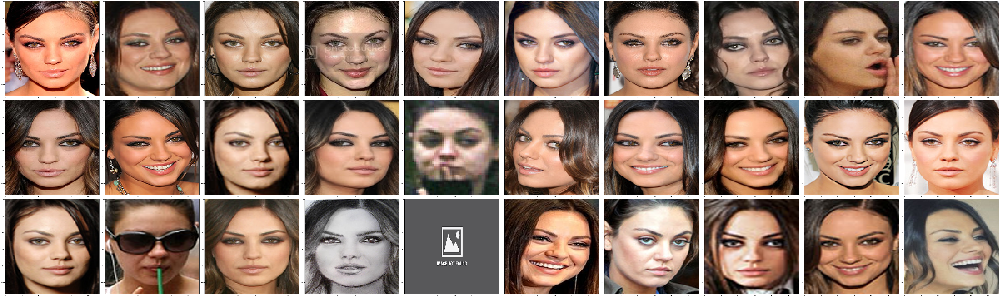

In [ ]:
plot_image_sequence(train_X[train_y == 2], n=30, imgs_per_row=10)

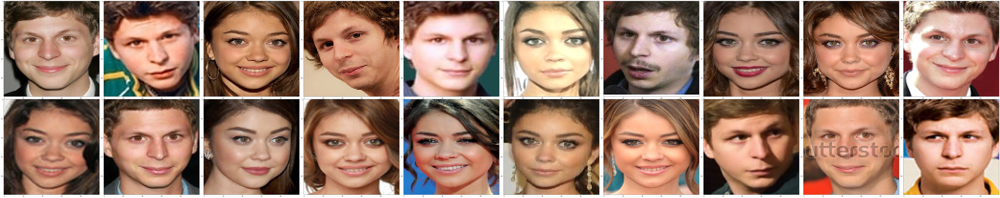

In [ ]:
plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)

In [ ]:
import numpy as np

# Make a copy of the original data to clean
train_X_cleaned = train_X.copy()
train_y_cleaned = train_y.copy()

# --- 1. Outliers for class '1' ---
jesse_indices = np.where(train_y_cleaned == 1)[0]

# Outlier positions (0-indexed relative to class '1' images)
outlier_positions_1 = [8]

# Map to actual dataset indices
indices_to_drop_1 = jesse_indices[outlier_positions_1]

# --- 2. Outliers for class '2' ---
mila_indices = np.where(train_y_cleaned == 2)[0]

# Outlier positions (0-indexed relative to class '2' images)
outlier_positions_2 = [21,24]

# Map to actual dataset indices
indices_to_drop_2 = mila_indices[outlier_positions_2]

# Combine all outlier indices
all_outliers = np.concatenate([indices_to_drop_1, indices_to_drop_2])

# Delete all at once
train_X_cleaned = np.delete(train_X, all_outliers, axis=0)
train_y_cleaned = np.delete(train_y, all_outliers, axis=0)

print(f"Removed {len(all_outliers)} outliers in total.")

Removed 3 outliers in total.


In [ ]:
train_X_aug = list(train_X_cleaned)
train_y_aug = list(train_y_cleaned)

classes = np.unique(train_y_cleaned)

# --- Define augmentations ---
def horizontal_flip(img):
    return np.flip(img, axis=1)

def rotate_image(img, angle):
    h, w = img.shape[:2]
    center = (w//2, h//2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

def adjust_contrast_brightness(img, alpha=0.7, beta=15):
    img = img * alpha + beta / 255.0  # assume img in [0,1]
    return np.clip(img, 0.0, 1.0)

for cls in classes:
    class_indices = np.where(train_y_cleaned == cls)[0]

    for idx in class_indices:
        img = train_X_cleaned[idx]

        # --- Standard augmentations (for all classes) ---
        train_X_aug.append(horizontal_flip(img))
        train_y_aug.append(cls)

        train_X_aug.append(adjust_contrast_brightness(img, alpha=1.3, beta=15))
        train_y_aug.append(cls)

        train_X_aug.append(rotate_image(img, angle=20))
        train_y_aug.append(cls)

        train_X_aug.append(rotate_image(img, angle=-20))
        train_y_aug.append(cls)

        # Extra for class 0
        if cls == 0:
            img = horizontal_flip(img)  # flip
            img = adjust_contrast_brightness(img, alpha=0.7, beta=-15)  # darker
            img = rotate_image(img, angle=15)  # rotate
            train_X_aug.append(img)
            train_y_aug.append(cls)


# Convert to numpy arrays
train_X_bal = np.array(train_X_aug, dtype=np.float32)
train_y_bal = np.array(train_y_aug)

# Print class distribution
for cls in np.unique(train_y_bal):
    print(f"Class {cls} -> {np.sum(train_y_bal==cls)} images")

# Shuffle indices
indices = np.random.permutation(len(train_X_bal))

# Apply shuffle
X_aug = train_X_bal[indices]
y_aug = train_y_bal[indices]

print("Dataset shuffled")
print("Shape X_aug:", X_aug.shape)

Class 0 -> 120 images
Class 1 -> 145 images
Class 2 -> 140 images
Dataset shuffled
Shape X_aug: (405, 114, 114, 3)


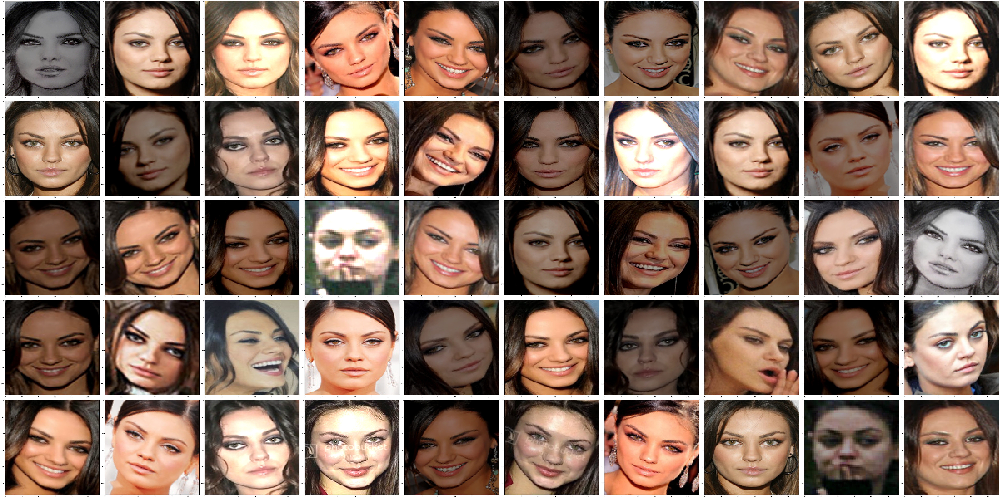

In [ ]:
plot_image_sequence(X_aug[y_aug == 2], n=50, imgs_per_row=10)

In [ ]:
plot_image_sequence(test_X[1400:1500], n=100, imgs_per_row=10)

# PCA Feature Extraction

In [ ]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""

    def transform(self, X):
        return X

    def __call__(self, X):
        return self.transform(X)

In [ ]:
class PCAFeatureExtractor(IdentityFeatureExtractor):
    def __init__(self, n_components=None):
        self.n_components = n_components
        self.mean_ = None
        self.components_ = None
        self.explained_variance_ = None
        self.explained_variance_ratio_ = None
        self.singular_values_ = None
        self.image_shape_ = None
        self.n_features_ = None
        self.n_samples_ = None
        self.is_fitted_ = False
        self.is_use_RGB_ = False
        self.is_use_sklearn_ = False
        self.pca_ = None  # sklearn PCA object

    def _to_gray(self, X):
        X = np.asarray(X, dtype=np.float32)  # keep float32
        if X.ndim == 4:  # batch of RGB images
            X_gray = []
            for img in X:
                img = np.nan_to_num(img, nan=0.0)  # replace NaN
                img = np.clip(img, 0.0, 1.0)       # ensure [0,1]
                img_uint8 = (img * 255).astype(np.uint8)
                gray = cv2.cvtColor(img_uint8, cv2.COLOR_BGR2GRAY) / 255.0
                X_gray.append(gray.astype(np.float32))
            return np.array(X_gray, dtype=np.float32)
        elif X.ndim == 3:  # already grayscale
            return np.clip(np.nan_to_num(X, nan=0.0), 0.0, 1.0).astype(np.float32)
        else:
            raise ValueError("X must have shape (N, H, W) or (N, H, W, C)")

    def _flatten(self, X):
        if not self.is_use_RGB_:
            X_gray = self._to_gray(X)
            return X_gray.reshape(X.shape[0], -1)
        else:
            return X.reshape(X.shape[0], -1).astype(np.float32)

    # FIT
    def fit(self, X, comp_mean=True, use_RGB=False, use_sklearn=False):
        self.is_use_RGB_ = use_RGB
        self.is_use_sklearn_ = use_sklearn

        if use_sklearn:
            return self._fit_sklearn(X)
        else:
            return self._fit_manual(X, comp_mean)

    def _fit_manual(self, X, comp_mean):
        X_flat = self._flatten(X)

        self.n_samples_, self.n_features_ = X_flat.shape
        self.image_shape_ = X.shape[1:3]

        if comp_mean:
            self.mean_ = X_flat.mean(axis=0, keepdims=True)
        else:
            self.mean_ = np.zeros((1, self.n_features_), dtype=np.float32)

        X_centered = X_flat - self.mean_

        U, S, Vt = np.linalg.svd(X_centered, full_matrices=False)

        max_rank = min(self.n_samples_ - 1, self.n_features_)
        k = max_rank if self.n_components is None else min(self.n_components, max_rank)

        self.components_ = Vt[:k]
        self.singular_values_ = S[:k]

        if self.n_samples_ > 1:
            all_var = (S ** 2) / (self.n_samples_ - 1)
        else:
            all_var = np.zeros_like(S)

        self.explained_variance_ = all_var[:k]

        total_var = np.sum(all_var)
        self.explained_variance_ratio_ = (
            self.explained_variance_ / total_var if total_var > 0
            else np.zeros_like(self.explained_variance_)
        )

        self.is_fitted_ = True
        return self

    def _fit_sklearn(self, X):
        X_flat = self._flatten(X)

        self.n_samples_, self.n_features_ = X_flat.shape
        self.image_shape_ = X.shape[1:3]

        self.pca_ = PCA(n_components=self.n_components)
        self.pca_.fit(X_flat)

        self.mean_ = self.pca_.mean_.reshape(1, -1)
        self.components_ = self.pca_.components_
        self.singular_values_ = self.pca_.singular_values_
        self.explained_variance_ = self.pca_.explained_variance_
        self.explained_variance_ratio_ = self.pca_.explained_variance_ratio_

        self.is_fitted_ = True
        return self

    # TRANSFORM
    def transform(self, X):
        if not self.is_fitted_:
            raise ValueError("Call fit() before transform().")

        X_flat = self._flatten(X)

        if self.is_use_sklearn_:
            return self.pca_.transform(X_flat)
        else:
            X_centered = X_flat - self.mean_
            return X_centered @ self.components_.T

    # RECONSTRUCTION
    def reconstruct_with_k(self, X, k):
        if not self.is_fitted_:
            raise ValueError("Call fit() before reconstruct_with_k().")

        X_flat = self._flatten(X)
        N = X.shape[0]
        H, W = self.image_shape_

        if self.is_use_sklearn_:
            Z = self.pca_.transform(X_flat)
            Z[:, k:] = 0
            X_recon = self.pca_.inverse_transform(Z)
        else:
            X_centered = X_flat - self.mean_
            k = min(k, self.components_.shape[0])
            Zk = X_centered @ self.components_[:k].T
            X_recon = Zk @ self.components_[:k] + self.mean_

        if self.is_use_RGB_:
            return X_recon.reshape(N, H, W, 3)
        else:
            return X_recon.reshape(N, H, W)

    # UTILITIES
    def choose_p_by_variance(self, threshold=0.95):
        cumulative = np.cumsum(self.explained_variance_ratio_)
        p = np.searchsorted(cumulative, threshold) + 1
        return p, cumulative

    def __call__(self, X):
        return self.transform(X)


In [ ]:
# Copy the training data to avoid manipulating the original data
data_train = np.copy(X_aug)
print("Shape:", data_train.shape)
# Create an object to extract all possible principal components
pca_all = PCAFeatureExtractor(n_components=None)
pca_all.fit(data_train, comp_mean=True, use_RGB=False, use_sklearn=False)
X_train_pca = pca_all.transform(data_train)

p, cumulative_var = pca_all.choose_p_by_variance(threshold=0.90)
print("Chosen p =", p)

Shape: (405, 114, 114, 3)
Chosen p = 86


In [ ]:
pca_all = PCAFeatureExtractor(n_components=86)
pca_all.fit(data_train, comp_mean=True, use_RGB=False, use_sklearn=False)           
X_train_pca = pca_all.transform(data_train)
X_test_pca = pca_all.transform(test_X)

# --- Step 2: Define F1 scorer ---
f1_scorer = make_scorer(f1_score, average='macro')

# --- Step 3: Parameter grid ---
param_grid = [
    {'kernel': ['rbf','sigmoid'], 'C': [0.1, 1, 10, 100],
     'gamma': ['scale','auto',0.01,0.001]}
]

# --- Step 4: GridSearchCV with class_weight='balanced' ---
svm_grid = GridSearchCV(
    SVC(class_weight='balanced'),
    param_grid,
    cv=8,
    scoring=f1_scorer,
    n_jobs=-1,
    verbose=1
)

# --- Step 5: Fit GridSearchCV ---
svm_grid.fit(X_train_pca, y_aug)

# --- Step 6: Print best parameters ---
print("Best parameter combination found:")
print(svm_grid.best_params_)

# --- Step 7: Cross-validated predictions on training set ---
y_train_pred = cross_val_predict(svm_grid.best_estimator_, X_train_pca, y_aug, cv=8)

# --- Step 8: Compute per-class and macro F1 scores ---
f1_per_class = f1_score(y_aug, y_train_pred, average=None)
for cls, score in zip([0, 1, 2], f1_per_class):
    print(f"F1 score for class {cls}: {score:.3f}")

f1_macro = f1_score(y_aug, y_train_pred, average='macro')
print(f"Macro F1 score: {f1_macro:.3f}")

# --- Step 9: Full classification report ---
print("\nClassification Report:\n", classification_report(y_aug, y_train_pred, digits=3))

# --- Step 10 (optional): Predict on test set ---
y_test_pred = svm_grid.predict(X_test_pca)

Fitting 8 folds for each of 32 candidates, totalling 256 fits
Best parameter combination found:
{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
F1 score for class 0: 0.880
F1 score for class 1: 0.952
F1 score for class 2: 0.946
Macro F1 score: 0.926

Classification Report:
               precision    recall  f1-score   support

           0      0.876     0.883     0.880       120
           1      0.946     0.959     0.952       145
           2      0.956     0.936     0.946       140

    accuracy                          0.928       405
   macro avg      0.926     0.926     0.926       405
weighted avg      0.929     0.928     0.928       405



In [ ]:
# --- 1. Safe grayscale conversion ---
def to_gray_safe(X):
    """
    Convert a batch of images to grayscale safely.
    Works with float32 in [0,1] or uint8 in [0,255].
    Returns float32 in [0,1].
    """
    X = np.asarray(X, dtype=np.float32)

    if X.ndim == 4 and X.shape[3] == 3:  # RGB batch
        # Convert float [0,1] -> uint8 [0,255] for cv2.cvtColor
        X_uint8 = (np.clip(X, 0, 1) * 255).astype(np.uint8)
        X_gray = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in X_uint8], dtype=np.float32)
        X_gray /= 255.0  # back to [0,1] float
    elif X.ndim == 3:  # already grayscale
        X_gray = np.clip(X, 0, 1).astype(np.float32)
    else:
        raise ValueError("Input X must have shape (N,H,W,3) or (N,H,W)")
    return X_gray

# --- 2. Compute reconstruction error ---
def reconstruction_error(pca_obj, X, k=None):
    """
    Reconstruct images using top-k PCA components and compute MSE per image.
    """
    X_gray = to_gray_safe(X)

    if k is None:
        k = pca_obj.components_.shape[0]

    X_recon = pca_obj.reconstruct_with_k(X_gray, k)

    # Flatten to compute MSE
    X_flat = X_gray.reshape(X_gray.shape[0], -1)
    X_recon_flat = X_recon.reshape(X_recon.shape[0], -1)

    mse_per_image = np.mean((X_flat - X_recon_flat)**2, axis=1)
    return X_recon, mse_per_image

# --- 3. Plot top eigenfaces ---
def plot_eigenfaces(pca_obj, n_components=16):
    """
    Plots top-n PCA components (eigenfaces).
    Assumes PCA on grayscale images.
    """
    eigenfaces = pca_obj.components_[:n_components]
    H, W = pca_obj.image_shape_

    plt.figure(figsize=(12, 8))
    for i, ef in enumerate(eigenfaces):
        plt.subplot(int(np.ceil(n_components/4)), 4, i+1)
        plt.imshow(ef.reshape(H, W), cmap='gray')
        plt.title(f'PC {i+1}')
        plt.axis('off')
    plt.suptitle('Top Eigenfaces', fontsize=16)
    plt.show()

# --- 4. Plot original vs reconstructed images ---
def plot_reconstruction(X_original, X_recon, n_images=5):
    """
    Plots original and reconstructed images side by side.
    Automatically handles RGB or grayscale images.
    """
    X_orig_gray = to_gray_safe(X_original) if X_original.ndim == 4 else X_original
    X_recon_gray = to_gray_safe(X_recon) if X_recon.ndim == 4 else X_recon

    plt.figure(figsize=(10, 4))
    for i in range(n_images):
        # Original
        plt.subplot(2, n_images, i+1)
        plt.imshow(X_orig_gray[i], cmap='gray')
        plt.title('Original')
        plt.axis('off')

        # Reconstructed
        plt.subplot(2, n_images, i+1+n_images)
        plt.imshow(X_recon_gray[i], cmap='gray')
        plt.title('Reconstructed')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

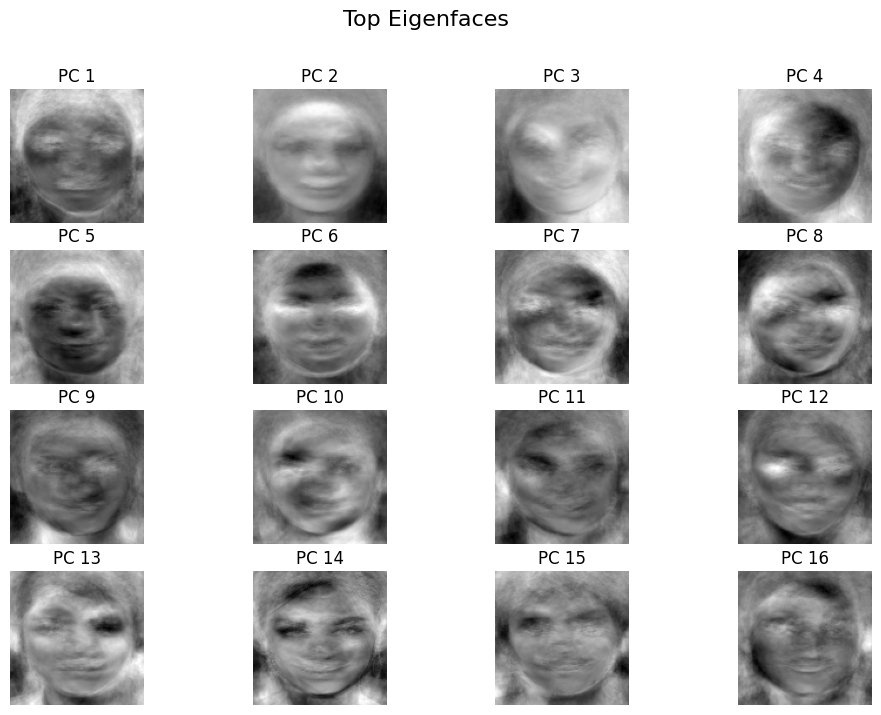

In [ ]:
plot_eigenfaces(pca_all)

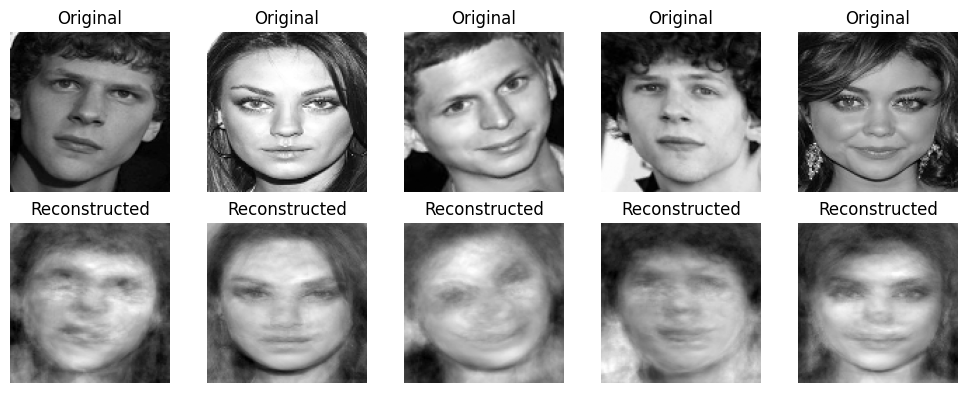

Image 0 reconstruction MSE: 0.01
Image 1 reconstruction MSE: 0.01
Image 2 reconstruction MSE: 0.01
Image 3 reconstruction MSE: 0.01
Image 4 reconstruction MSE: 0.01


In [ ]:
# Pick first 5 images from the training set
X_sample = data_train[15:20]

# Reconstruct using top-k components
k = 48  # number of principal components to use
X_recon, mse = reconstruction_error(pca_all, X_sample, k=k)

# Plot original vs reconstructed
plot_reconstruction(X_sample, X_recon, n_images=5)

# Print MSE per image
for i, error in enumerate(mse):
    print(f"Image {i} reconstruction MSE: {error:.2f}")

# State of the Art Appraoch

In [ ]:
recognition_model = get_model('buffalo_l', providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
recognition_model.prepare(ctx_id=0)

def get_embeddings_from_crops(images, model):
    embeddings = []
    for img in images:
        img_bgr = (img * 255).astype(np.uint8)[..., ::-1]  # RGB → BGR uint8
        emb = model.get_feat(img_bgr)  # use get_feat() for already-cropped faces
        embeddings.append(emb)
    return np.array(embeddings)

train_embeddings = get_embeddings_from_crops(train_X, recognition_model)
test_embeddings  = get_embeddings_from_crops(test_X, recognition_model)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}


In [ ]:
train_embeddings = get_embeddings_from_crops(X_aug, recognition_model)

In [ ]:
from sklearn.preprocessing import normalize
from sklearn.model_selection import StratifiedKFold, cross_validate

# --- Normalize ---
train_emb_norm = normalize(train_embeddings)
test_emb_norm  = normalize(test_embeddings)

# --- Cross-validation on train only ---
clf = SVC(kernel='linear', probability=True)
cv  = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_validate(
    clf, train_emb_norm, y_aug,
    cv=cv,
    scoring=['accuracy', 'f1_weighted'],
    return_train_score=True
)

print("=== 5-Fold Cross-Validation ===")
print(f"Train Accuracy: {cv_results['train_accuracy'].mean():.4f} ± {cv_results['train_accuracy'].std():.4f}")
print(f"Val   Accuracy: {cv_results['test_accuracy'].mean():.4f}  ± {cv_results['test_accuracy'].std():.4f}")
print(f"Train F1:       {cv_results['train_f1_weighted'].mean():.4f} ± {cv_results['train_f1_weighted'].std():.4f}")
print(f"Val   F1:       {cv_results['test_f1_weighted'].mean():.4f}  ± {cv_results['test_f1_weighted'].std():.4f}")

# --- Fit on full train set ---
clf.fit(train_emb_norm, y_aug)

# --- Predict test (no labels needed) ---
predictions = clf.predict(test_emb_norm)
probas      = clf.predict_proba(test_emb_norm)  # confidence per class

print("\n=== Test Predictions ===")
for i, (pred, proba) in enumerate(zip(predictions, probas)):
    confidence = proba.max()
    print(f"Image {i}: class={pred}, confidence={confidence:.3f}")

=== 5-Fold Cross-Validation ===
Train Accuracy: 1.0000 ± 0.0000
Val   Accuracy: 1.0000  ± 0.0000
Train F1:       1.0000 ± 0.0000
Val   F1:       1.0000  ± 0.0000

=== Test Predictions ===
Image 0: class=1, confidence=0.995
Image 1: class=0, confidence=0.994
Image 2: class=0, confidence=0.995
Image 3: class=0, confidence=0.448
Image 4: class=1, confidence=0.995
Image 5: class=1, confidence=0.996
Image 6: class=1, confidence=0.981
Image 7: class=0, confidence=0.986
Image 8: class=1, confidence=0.995
Image 9: class=0, confidence=0.990
Image 10: class=2, confidence=0.996
Image 11: class=1, confidence=0.981
Image 12: class=2, confidence=0.987
Image 13: class=0, confidence=0.993
Image 14: class=0, confidence=0.986
Image 15: class=1, confidence=0.993
Image 16: class=1, confidence=0.999
Image 17: class=2, confidence=0.974
Image 18: class=0, confidence=0.979
Image 19: class=1, confidence=0.981
Image 20: class=2, confidence=0.989
Image 21: class=2, confidence=0.994
Image 22: class=2, confidence=

In [ ]:
pd.DataFrame({
    'id':    range(len(predictions)),
    'class': predictions
}).to_csv('/content/drive/MyDrive/embeddings_predictions.csv', index=False)

print(f"Predictions saved to predictions.csv  ({len(predictions)} rows)")

Predictions saved to predictions.csv  (1816 rows)
